In [3]:
from google.colab import files
files.upload()

Saving energy_dataset.csv to energy_dataset.csv


{'energy_dataset.csv': b'time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual\n2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17.0,,6436.0,26118.0,25385.0,50.1,65.41\n2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0

##Import Libraries

In [4]:
# Import Libraries
import os
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm 
import tensorflow as tf
import xgboost as xgb 
import os
import warnings
from tensorflow.keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, TimeDistributed, Flatten, Dropout, RepeatVector
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss, ccf
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from math import sqrt


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [6]:
# Read dataset
df_weather = pd.read_csv('weather_features.csv',
                         parse_dates=['dt_iso']
                         )

df_energy = pd.read_csv('energy_dataset.csv',
                        parse_dates=['time']
                        )



##Energy Dataset

In [7]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil coal-derived gas           35046 non-null  float64
 4   generation fossil gas                        35046 non-null  float64
 5   generation fossil hard coal                  35046 non-null  float64
 6   generation fossil oil                        35045 non-null  float64
 7   generation fossil oil shale                  35046 non-null  float64
 8   generation fossil peat                       35046 non-null  float64
 9   generation geothermal                        35046 non-null  float64
 10

In [8]:
df_energy.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,920.0,1009.0,1658.0,0.0,7096.0,43.0,71.0,50.0,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,1164.0,973.0,1371.0,0.0,7099.0,43.0,73.0,50.0,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,1503.0,949.0,779.0,0.0,7098.0,43.0,75.0,50.0,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,1826.0,953.0,720.0,0.0,7097.0,43.0,74.0,42.0,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


Langkah selanjutnya menghapus semua kolom yang terdiri dari nol dan NaN, karena tidak dapat digunakan. Dan juga akan menghapus kolom yang tidak akan digunakan sama sekali dalam analisis dan yang berisi prakiraan hari ke depan untuk total load, solar energy dan wind energy.

In [9]:
# Drop kolom yang tidak dugunakan
df_energy = df_energy.drop(['generation fossil coal-derived gas','generation fossil oil shale', 
                            'generation fossil peat', 'generation geothermal', 
                            'generation hydro pumped storage aggregated', 'generation marine', 
                            'generation wind offshore', 'forecast wind offshore eday ahead',
                            'total load forecast', 'forecast solar day ahead',
                            'forecast wind onshore day ahead'], axis= 1)

In [10]:
df_energy.describe().round(2)

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load actual,price day ahead,price actual
count,35045.00,35046.00,35046.00,35046.00,35045.00,35045.00,35045.00,35046.00,35047.00,35046.00,35046.00,35046.00,35045.00,35046.00,35028.00,35064.00,35064.00
mean,383.51,448.06,5622.74,4256.07,298.32,475.58,972.12,2605.11,6263.91,60.23,85.64,1432.67,269.45,5464.48,28696.94,49.87,57.88
std,85.35,354.57,2201.83,1961.60,52.52,792.41,400.78,1835.20,839.67,20.24,14.08,1680.12,50.20,3213.69,4574.99,14.62,14.20
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,18041.00,2.06,9.33
25%,333.00,0.00,4126.00,2527.00,263.00,0.00,637.00,1077.25,5760.00,53.00,73.00,71.00,240.00,2933.00,24807.75,41.49,49.35
50%,367.00,509.00,4969.00,4474.00,300.00,68.00,906.00,2164.00,6566.00,57.00,88.00,616.00,279.00,4849.00,28901.00,50.52,58.02
75%,433.00,757.00,6429.00,5838.75,330.00,616.00,1250.00,3757.00,7025.00,80.00,97.00,2578.00,310.00,7398.00,32192.00,60.53,68.01
max,592.00,999.00,20034.00,8359.00,449.00,4523.00,2000.00,9728.00,7117.00,106.00,119.00,5792.00,357.00,17436.00,41015.00,101.99,116.80


In [11]:
df_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil gas                        35046 non-null  float64
 4   generation fossil hard coal                  35046 non-null  float64
 5   generation fossil oil                        35045 non-null  float64
 6   generation hydro pumped storage consumption  35045 non-null  float64
 7   generation hydro run-of-river and poundage   35045 non-null  float64
 8   generation hydro water reservoir             35046 non-null  float64
 9   generation nuclear                           35047 non-null  float64
 10

Kolom 'time', yang ingin kita fungsikan sebagai indeks pengamatan dalam deret waktu belum diuraikan dengan benar dan dikenali sebagai objek.

In [12]:
# Convert time to datetime object and it as index
df_energy['time'] = pd.to_datetime(df_energy['time'], utc=True, infer_datetime_format = True)
df_energy = df_energy.set_index('time')

In [13]:
# Find NaNs and duplicates in df_energy
print('There are {} missing values or NaNs in df_energy.'.format(df_energy.isnull().values.sum()))
temp_energy = df_energy.duplicated(keep = 'first').sum()
print('There are {} duplicate rows in df_energy based on all columns.'
.format(temp_energy))

There are 292 missing values or NaNs in df_energy.
There are 0 duplicate rows in df_energy based on all columns.


Seperti yang kita lihat, df_energy tidak memiliki nilai duplikat. Namun demikian, ia memiliki beberapa NaN dan karenanya, kami harus menyelidiki lebih lanjut. Karena ini adalah tugas peramalan deret waktu, kita tidak bisa begitu saja membuang baris dengan nilai yang hilang dan akan menjadi ide yang lebih baik untuk mengisi nilai yang hilang menggunakan interpolasi.

In [14]:
# Find the number of NaNs in each column
df_energy.isnull().sum(axis=0)

generation biomass                             19
generation fossil brown coal/lignite           18
generation fossil gas                          18
generation fossil hard coal                    18
generation fossil oil                          19
generation hydro pumped storage consumption    19
generation hydro run-of-river and poundage     19
generation hydro water reservoir               18
generation nuclear                             17
generation other                               18
generation other renewable                     18
generation solar                               18
generation waste                               19
generation wind onshore                        18
total load actual                              36
price day ahead                                 0
price actual                                    0
dtype: int64

Sebagian besar nilai nol dapat ditemukan di kolom 'total load actual'. Oleh karena itu, ada baiknya untuk memvisualisasikannya dan melihat apa yang bisa kita lakukan. Kabar baiknya adalah tidak ada NaN di kolom 'price actual', yang akan kita gunakan sebagai variabel target untuk melatih model kita. Angka-angka serupa dalam nilai nol di kolom yang berkaitan dengan jenis pembangkitan energi mungkin menunjukkan bahwa mereka juga akan muncul di baris yang sama. Mari kita mendefinisikan fungsi plot yang kemudian akan kita gunakan untuk memvisualisasikan kolom 'total load actual' serta kolom lainnya.

In [15]:
# Define a function to plot different types of time-series

def plot_series(df=None, column=None, series=pd.Series([]), 
                label=None, ylabel=None, title=None, start=0, end=None):
    """
    Plots a certain time-series which has either been loaded in a dataframe
    and which constitutes one of its columns or it a custom pandas series 
    created by the user. The user can define either the 'df' and the 'column' 
    or the 'series' and additionally, can also define the 'label', the 
    'ylabel', the 'title', the 'start' and the 'end' of the plot.
    """
    sns.set()
    fig, ax = plt.subplots(figsize=(30, 12))
    ax.set_xlabel('Time', fontsize=16)
    if column:
        ax.plot(df[column][start:end], label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if series.any():
        ax.plot(series, label=label)
        ax.set_ylabel(ylabel, fontsize=16)
    if label:
        ax.legend(fontsize=16)
    if title:
        ax.set_title(title, fontsize=24)
    ax.grid(True)
    return ax

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  This is separate from the ipykernel package so we can avoid doing imports until


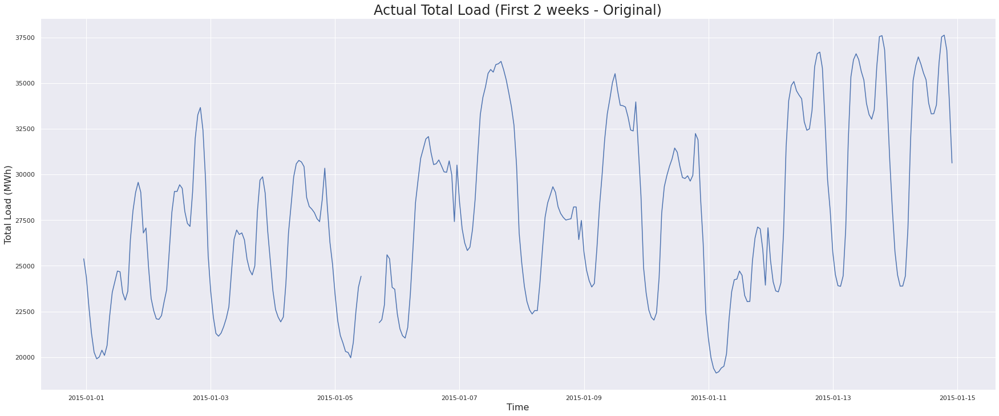

In [16]:
# Zoom into the plot of the hourly (actual) total load

ax = plot_series(df=df_energy, column='total load actual', ylabel='Total Load (MWh)',
                 title='Actual Total Load (First 2 weeks - Original)', end=24*7*2)
plt.show()


Setelah memperbesar 2 minggu pertama kolom 'Actual total load', kita sudah dapat melihat bahwa ada nilai nol selama beberapa jam. Namun, jumlah nilai yang hilang dan perilaku deret menunjukkan bahwa interpolasi akan mengisi NaN dengan cukup baik. Mari kita selidiki lebih lanjut jika nilai nol bertepatan di kolom yang berbeda. Mari kita tampilkan lima baris terakhir.

In [17]:
# Display the rows with null values
df_energy[df_energy.isnull().any(axis=1)].tail()

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,
2016-11-23 03:00:00+00:00,NaN,900.0,4838.0,4547.0,269.0,1413.0,795.0,435.0,5040.0,60.0,85.0,15.0,227.0,4598.0,23112.0,43.19,49.11
2017-11-14 11:00:00+00:00,0.0,0.0,10064.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,60.53,66.17
2017-11-14 18:00:00+00:00,0.0,0.0,12336.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,68.05,75.45
2018-06-11 16:00:00+00:00,331.0,506.0,7538.0,5360.0,300.0,1.0,1134.0,4258.0,5856.0,52.0,96.0,170.0,269.0,9165.0,NaN,69.87,64.93
2018-07-11 07:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.01,69.79


Jika kami mencari semuanya secara manual, kami akan mengkonfirmasi bahwa nilai nol di kolom yang berkaitan dengan jenis pembangkit energi sebagian besar bertepatan. Nilai nol dalam 'actual total load ' juga bertepatan dengan kolom yang disebutkan di atas, tetapi juga muncul di baris lain. Untuk menangani nilai nol dalam df_energy, kita akan menggunakan interpolasi linier dengan arah maju. Mungkin jenis interpolasi lain akan lebih baik; namun demikian, kami lebih suka menggunakan model yang paling sederhana. Hanya sebagian kecil dari data input kami yang akan noisy dan tidak akan mempengaruhi kinerja secara nyata.

In [18]:
# Fill null values using interpolation 
df_energy.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

In [19]:
# Display the number of non-zero values in each column 
print('Non-zero values in each column:\n', df_energy.astype(bool).sum(axis=0), sep='\n')

Non-zero values in each column:

generation biomass                             35060
generation fossil brown coal/lignite           24540
generation fossil gas                          35063
generation fossil hard coal                    35061
generation fossil oil                          35061
generation hydro pumped storage consumption    22450
generation hydro run-of-river and poundage     35061
generation hydro water reservoir               35061
generation nuclear                             35061
generation other                               35060
generation other renewable                     35061
generation solar                               35061
generation waste                               35061
generation wind onshore                        35061
total load actual                              35064
price day ahead                                35064
price actual                                   35064
dtype: int64


Sepertinya df_energy telah berhasil dibersihkan dan siap untuk digunakan lebih lanjut sebagai masukan ke dalam model kami. Angka 1-4 dalam kolom yang berkaitan dengan pembangkitan energi menurut jenisnya seharusnya tidak terlalu menjadi perhatian kita. 'generation hydro pumped storage consumption' mungkin terlihat mencurigakan, tetapi kita harus ingat bahwa jenis energi ini hanya digunakan untuk penyeimbangan beban, yang dikonsumsi saat kebutuhan energi puncak.

##Weather Features Dataset

In [21]:
df_weather.head()

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n


In [22]:
df_weather.describe().round(2)

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
count,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00
mean,289.62,288.33,291.09,1069.26,68.42,2.47,166.59,0.08,0.00,0.00,25.07,759.83
std,8.03,7.96,8.61,5969.63,21.90,2.10,116.61,0.40,0.01,0.22,30.77,108.73
min,262.24,262.24,262.24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,200.00
25%,283.67,282.48,284.65,1013.00,53.00,1.00,55.00,0.00,0.00,0.00,0.00,800.00
50%,289.15,288.15,290.15,1018.00,72.00,2.00,177.00,0.00,0.00,0.00,20.00,800.00
75%,295.15,293.73,297.15,1022.00,87.00,4.00,270.00,0.00,0.00,0.00,40.00,801.00
max,315.60,315.15,321.15,1008371.00,100.00,133.00,360.00,12.00,2.32,21.50,100.00,804.00


Di sini, kita dapat melihat bahwa semua kolom df_weather memiliki jumlah baris yang sama; kita masih harus memeriksa apa yang terjadi untuk setiap kota secara individual. Kita harus mencatat bahwa suhu dalam Kelvin. Yang paling penting untuk diperhatikan adalah ada beberapa masalah dan outlier. Secara khusus:

- Setidaknya terdapat satu outlier di kolom 'tekanan' karena nilai maksimumnya adalah 1.008.371 hPa atau sekitar 100 MPa, yang kira-kira merupakan tekanan di dasar Palung Mariana sekitar 11 km di bawah permukaan laut. Ini tidak bisa terjadi di sini.

- Setidaknya ada satu outlier di kolom 'wind_speed' karena nilai maksimumnya adalah 133 m/s. Pengukuran ini mendekati kecepatan angin tercepat yang pernah tercatat di Bumi, yang disebabkan oleh tornado Bridge Creek–Moore 1999, tornado F5 (intensitas terbesar skala Fujita). Tornado dengan intensitas seperti itu belum tercatat di Spanyol dan mudah-mudahan tidak akan terjadi di masa depan juga.

- Kolom 'rain_3h' seharusnya menyediakaninformasi tentang curah hujan (yaitu hujan) dari 3 jam terakhir dalam mm. Karena kolom 'rain_1h' seharusnya memberikan informasi yang sama tetapi hanya sekitar satu jam terakhir, masuk akal untuk mengasumsikan bahwa rata-ratanya akan kurang dari 'rain_3j'. Namun, hal ini tidak terjadi dalam deskripsi statistik di atas. Jadi, ada baiknya untuk memeriksa kolom-kolom tersebut lebih lanjut.

In [23]:
# Print the type of each variable in df_weather
df_weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178396 entries, 0 to 178395
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt_iso               178396 non-null  object 
 1   city_name            178396 non-null  object 
 2   temp                 178396 non-null  float64
 3   temp_min             178396 non-null  float64
 4   temp_max             178396 non-null  float64
 5   pressure             178396 non-null  int64  
 6   humidity             178396 non-null  int64  
 7   wind_speed           178396 non-null  int64  
 8   wind_deg             178396 non-null  int64  
 9   rain_1h              178396 non-null  float64
 10  rain_3h              178396 non-null  float64
 11  snow_3h              178396 non-null  float64
 12  clouds_all           178396 non-null  int64  
 13  weather_id           178396 non-null  int64  
 14  weather_main         178396 non-null  object 
 15  weather_descripti

Kita harus mengubah tipe beberapa kolom, sehingga semuanya menjadi float64. Kita juga harus mem-parsing 'dt_iso' dengan benar dan menamainya sebagai 'time' agar sesuai dengan indeks df_energy.

In [24]:
def df_convert_dtypes(df, convert_from, convert_to):
    cols = df.select_dtypes(include=[convert_from]).columns
    for col in cols:
        df[col] = df[col].values.astype(convert_to)
    return df

In [25]:
# Convert columns with int64 type values to float64 type

df_weather = df_convert_dtypes(df_weather, np.int64, np.float64)

In [26]:
# Convert dt_iso to datetime type, rename it and set it as index

df_weather['time'] = pd.to_datetime(df_weather['dt_iso'], utc=True, infer_datetime_format=True)
df_weather = df_weather.drop(['dt_iso'], axis=1)
df_weather = df_weather.set_index('time')

Kita harus membagi dataset df_weather menjadi 5 dataset, satu untuk setiap kota yang berbeda (Madrid, Barcelona, ​​Bilbao, Seville dan Valencia). Tapi pertama-tama, mari kita lihat nilai rata-rata untuk setiap kolom, dikelompokkan berdasarkan setiap kota (perhatikan bahwa rata-rata 'weather_id' tidak memiliki arti apa pun)

In [27]:
# Display average weather features grouped by each city

mean_weather_by_city = df_weather.groupby('city_name').mean()
mean_weather_by_city

,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id
city_name,,,,,,,,,,,,
Barcelona,289.848248,288.594704,291.021987,1284.010486,73.994221,2.786588,187.188043,0.117079,0.000327,0.000000,23.229648,760.917465
Bilbao,286.378489,284.916661,288.036687,1017.567439,79.089455,1.957470,159.883536,0.123493,0.001034,0.023455,43.960697,723.943228
Madrid,288.061071,286.824877,289.155600,1011.838448,59.776932,2.441696,173.293159,0.055083,0.000129,0.000029,22.397028,762.260264
Seville,293.105431,291.184103,295.962431,1018.504711,64.140732,2.483787,151.757179,0.045392,0.000180,0.000000,14.748770,771.409849
Valencia,290.780780,290.222277,291.355025,1015.973794,65.145113,2.692815,160.753820,0.035924,0.000226,0.000154,20.820999,781.228283


In [28]:
# Find NaNs and duplicates in df_weather

print('There are {} missing values or NaNs in df_weather.'
      .format(df_weather.isnull().values.sum()))

temp_weather = df_weather.duplicated(keep='first').sum()

print('There are {} duplicate rows in df_weather based on all columns.'
      .format(temp_weather))

There are 0 missing values or NaNs in df_weather.
There are 8622 duplicate rows in df_weather based on all columns.


Tampaknya df_weather memiliki banyak nilai duplikat. Namun, metode di atas juga dapat menunjukkan kepada kita baris yang memiliki nilai ujian yang sama. Bukan ini yang kami cari. Yang ingin kami pastikan, adalah tidak ada baris indeks duplikat, yaitu bahwa kami tidak memiliki banyak baris untuk jam yang sama persis. Tentu saja, kita juga harus memastikan bahwa duplikat ini berlaku untuk setiap kota. Karena, df_weather berisi informasi tentang 5 kota yang berbeda, sangat berguna untuk menampilkan jumlah pengamatan untuk masing-masing kota dan membandingkannya dengan ukuran df_energy.

In [29]:
# Display the number of rows in each dataframe

print('There are {} observations in df_energy.'.format(df_energy.shape[0]))

cities = df_weather['city_name'].unique()
grouped_weather = df_weather.groupby('city_name')

for city in cities:
    print('There are {} observations in df_weather'
          .format(grouped_weather.get_group('{}'.format(city)).shape[0]), 
          'about city: {}.'.format(city))

There are 35064 observations in df_energy.
There are 35145 observations in df_weather about city: Valencia.
There are 36267 observations in df_weather about city: Madrid.
There are 35951 observations in df_weather about city: Bilbao.
There are 35476 observations in df_weather about city:  Barcelona.
There are 35557 observations in df_weather about city: Seville.


Seperti yang kita lihat, dua kerangka data (df_energy dan df_weather) belum dapat digabungkan. Ada banyak duplikat untuk setiap kota di df_weather dan kita harus membuangnya dan melihat apakah jumlah barisnya cocok. Kami melakukan ini dengan mengatur ulang indeks, menjaga hanya baris pertama yang memiliki nilai 'waktu' dan 'nama_kota' yang sama dan kemudian mengatur lagi 'waktu' sebagai indeks. Untuk penelitian lebih lanjut tentang kumpulan data, mari kita juga membuat kerangka data kedua, df_weather_2 di mana kita melakukan prosedur yang sama, tetapi hanya menyimpan baris terakhir yang memiliki 'waktu' dan 'nama_kota' yang sama.

In [30]:
# Create df_weather_2 and drop duplicate rows in df_weather

df_weather_2 = df_weather.reset_index().drop_duplicates(subset=['time', 'city_name'], 
                                                        keep='last').set_index('time')

df_weather = df_weather.reset_index().drop_duplicates(subset=['time', 'city_name'],
                                                      keep='first').set_index('time')

In [31]:
# Display the number of rows in each dataframe again

print('There are {} observations in df_energy.'.format(df_energy.shape[0]))

grouped_weather = df_weather.groupby('city_name')

for city in cities:
    print('There are {} observations in df_weather'
          .format(grouped_weather.get_group('{}'.format(city)).shape[0]), 
          'about city: {}.'.format(city))

There are 35064 observations in df_energy.
There are 35064 observations in df_weather about city: Valencia.
There are 35064 observations in df_weather about city: Madrid.
There are 35064 observations in df_weather about city: Bilbao.
There are 35064 observations in df_weather about city:  Barcelona.
There are 35064 observations in df_weather about city: Seville.


Kolom 'weather_icon' tidak relevan untuk analisis kami, jadi kami akan menghapusnya. Selanjutnya, kolom 'weather_main' dan 'weather_description' berisi informasi yang kira-kira sama dengan kolom 'weather_id'; informasi tersebut menyangkut deskripsi kualitatif cuaca pada jam tertentu. Jadi, kami akan bekerja dengan hanya satu dari mereka. Namun, untuk membuat pilihan, kita harus memeriksa nilai unik serta konsistensi setiap kolom.

In [32]:
# Display all the unique values in the column 'weather_description'

weather_description_unique = df_weather['weather_description'].unique()
weather_description_unique

array(['sky is clear', 'few clouds', 'scattered clouds', 'broken clouds',
       'overcast clouds', 'light rain', 'moderate rain',
       'heavy intensity rain', 'mist', 'heavy intensity shower rain',
       'shower rain', 'very heavy rain', 'thunderstorm with heavy rain',
       'thunderstorm with light rain', 'proximity thunderstorm',
       'thunderstorm', 'light intensity shower rain',
       'light intensity drizzle', 'thunderstorm with rain', 'fog',
       'smoke', 'drizzle', 'heavy intensity drizzle', 'haze',
       'proximity shower rain', 'light snow', 'rain and snow',
       'light rain and snow', 'snow', 'sleet', 'rain and drizzle',
       'light intensity drizzle rain', 'light shower snow',
       'proximity moderate rain', 'ragged shower rain', 'heavy snow',
       'sand dust whirls', 'proximity drizzle', 'dust',
       'light thunderstorm', 'squalls'], dtype=object)

In [33]:
# Display all the unique values in the column 'weather_main'

weather_main_unique = df_weather['weather_main'].unique()
weather_main_unique

array(['clear', 'clouds', 'rain', 'mist', 'thunderstorm', 'drizzle',
       'fog', 'smoke', 'haze', 'snow', 'dust', 'squall'], dtype=object)

In [34]:
# Display all the unique values in the column 'weather_id'

weather_id_unique = df_weather['weather_id'].unique()
weather_id_unique

array([800., 801., 802., 803., 804., 500., 501., 502., 701., 522., 521.,
       503., 202., 200., 211., 520., 300., 201., 741., 711., 301., 302.,
       721., 600., 616., 615., 601., 611., 311., 310., 620., 531., 602.,
       731., 761., 210., 771.])

Kita dapat melihat bahwa dalam hal deskripsi kualitatif, kolom 'weather_main' tampaknya berisi informasi yang kurang detail -atau "paling buruk"-, sedangkan 'weather_id' dan 'weather_description' memiliki informasi yang lebih kompleks dan jumlah nilai unik yang kira-kira sama.

Namun demikian, juga berguna untuk memeriksa konsistensi informasi di setiap kolom. Karena kumpulan data kami berisi baris duplikat dan kami menggunakan dua metode berbeda untuk membersihkannya, cara yang sangat baik untuk memeriksa konsistensi data dalam tiga kolom ini adalah dengan membandingkan dua kerangka data yang dibersihkan, df_weather dan df_weather_2. Untuk melakukannya, kami menggunakan metrik R² ("R-kuadrat" atau "koefisien determinasi"), setelah menyandikan 'weather_description' dan 'weather_main' dari string ke label numerik.

In [35]:
# Define a function which will calculate R-squared score for the same column in two dataframes

def encode_and_display_r2_score(df_1, df_2, column, categorical=False):
    dfs = [df_1, df_2]
    if categorical:
        for df in dfs:
            le = LabelEncoder()
            df[column] = le.fit_transform(df[column])
    r2 = r2_score(df_1[column], df_2[column])
    print("R-Squared score of {} is {}".format(column, r2.round(3)))

In [36]:
# Display the R-squared scores for the columns with qualitative weather descriptions in df_weather and df_weather_2

encode_and_display_r2_score(df_weather, df_weather_2, 'weather_description', categorical=True)
encode_and_display_r2_score(df_weather, df_weather_2, 'weather_main', categorical=True)
encode_and_display_r2_score(df_weather, df_weather_2, 'weather_id')

R-Squared score of weather_description is 0.973
R-Squared score of weather_main is 0.963
R-Squared score of weather_id is 0.921


Tampaknya kami telah menemukan inkosistensi dalam dataset kami. Secara khusus, ketiga kolom yang berisi info kualitatif untuk kondisi cuaca tampaknya mengandung sebagian besar duplikat yang kami temukan sebelumnya di df_weather. Dari skor R-kuadrat di atas, tampaknya menyimpan dan mengkodekan 'weather_description' atau 'weather_main' adalah ide terbaik untuk mendapatkan hasil maksimal dari informasi dalam kumpulan data. Perhatikan bahwa nilai R² dari keduanya tidak dapat dibandingkan karena kami telah menyandikannya terlebih dahulu; untuk benar-benar menghitung kesamaan antara dua string, kita perlu menggunakan metrik yang berbeda seperti jarak Levenshtein, yaitu jumlah pengeditan yang diperlukan untuk mengubah string A ke string B. Dalam kasus ini, metrik ini pun tidak akan cukup dalam untuk membuat 'weather_main' dan 'weather_description' sebanding karena yang pertama hanya berisi satu kata sedangkan frasa besar yang terakhir menggambarkan cuaca.

In [37]:
# Drop columns with qualitative weather information
df_weather = df_weather.drop(['weather_main', 'weather_id', 
                              'weather_description', 'weather_icon'], axis=1)

Kami harus menekankan bahwa metode yang kami gunakan di atas untuk memeriksa konsistensi dataset kami tidak 100% akurat. Ini karena membandingkan dua kerangka data dari mana kami telah membersihkan duplikat hanya dalam dua cara secara eksklusif; menjaga baris pertama dan menjaga baris terakhir dari duplikat. Namun demikian, ini memberikan hasil yang baik dan dapat digunakan untuk memeriksa nilai kolom lain juga. Kami seharusnya tidak melakukannya karena kami menghapus duplikat berdasarkan semua kolom kecuali 'waktu' dan 'nama_kota', tidak ada gunanya memeriksa yang terakhir.

In [38]:
# Display the R-squared for all the columns in df_weather and df_weather_2

df_weather_cols = df_weather.columns.drop('city_name')

for col in df_weather_cols:
    encode_and_display_r2_score(df_weather, df_weather_2, col)

R-Squared score of temp is 1.0
R-Squared score of temp_min is 1.0
R-Squared score of temp_max is 1.0
R-Squared score of pressure is 1.0
R-Squared score of humidity is 1.0
R-Squared score of wind_speed is 1.0
R-Squared score of wind_deg is 1.0
R-Squared score of rain_1h is 1.0
R-Squared score of rain_3h is 1.0
R-Squared score of snow_3h is 1.0
R-Squared score of clouds_all is 1.0


Di atas menegaskan intuisi kami bahwa 'weather_description', 'weather_main' dan 'weather_id' adalah satu-satunya penyebab duplikat di df_weather dan meskipun kami tidak sepenuhnya yakin untuk ini (untuk alasan yang kami jelaskan di atas), itu lebih dari cukup untuk menegaskan kembali validitas dan konsistensi kolom lainnya di df_weather yang berisi nilai numerik.

In [39]:
# Display the number of duplicates in df_weather

temp_weather = df_weather.reset_index().duplicated(subset=['time', 'city_name'], 
                                                   keep='first').sum()
print('There are {} duplicate rows in df_weather ' \
      'based on all columns except "time" and "city_name".'.format(temp_weather))

There are 0 duplicate rows in df_weather based on all columns except "time" and "city_name".


Sebelum melanjutkan ke langkah berikutnya, yaitu menggabungkan df_energy dan df_weather, kami juga ingin memperlakukan outlier yang kami temukan sebelumnya di 'tekanan' dan 'kecepatan_angin'. Kami akan memvisualisasikan outlier di kolom ini menggunakan boxplot, mengubah nilainya menjadi NaNs dan kemudian menggunakan interpolasi linier untuk mengganti nilainya.

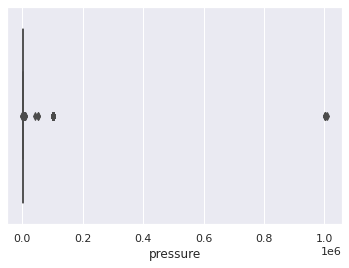

In [40]:
# Check for outliers in 'pressure' column

sns.boxplot(x=df_weather['pressure'])
plt.show()

Bahkan tekanan sekitar 100.000 HPa atau 10 MPa, yang terlihat jelas pada gambar di atas, sesuai dengan kuantitas yang lebih besar dari tekanan atmosfer Venus. Untuk memastikan, kami akan menetapkan sebagai NaN setiap nilai di kolom 'tekanan' yang lebih tinggi dari 1051 hPa, yang tepat di atas tekanan udara tertinggi yang pernah tercatat di semenanjung Iberia. Sementara outlier di sisi rendah tidak terlihat pada boxplot di atas, ada baiknya juga mengganti nilai yang lebih rendah dari 931 hPa, yaitu tekanan udara terendah yang pernah tercatat di semenanjung Iberia.

In [41]:
# Replace outliers in 'pressure' with NaNs

df_weather.loc[df_weather.pressure > 1051, 'pressure'] = np.nan
df_weather.loc[df_weather.pressure < 931, 'pressure'] = np.nan

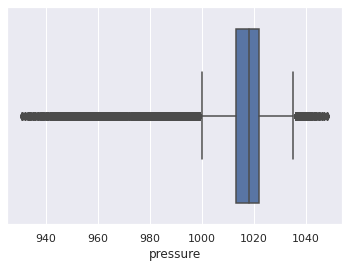

In [42]:
# Check for outliers in 'pressure' column again

sns.boxplot(x=df_weather['pressure'])
plt.show()

Hal-hal terlihat jauh lebih baik mengenai tekanan atmosfer ('tekanan') karena kolom telah dibersihkan dari outlier kasus ekstrim. Bagaimana dengan 'wind_speed'?

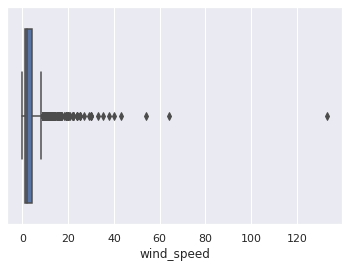

In [43]:
# Check for outliers in 'wind_speed' column

sns.boxplot(x=df_weather['wind_speed'])
plt.show()

Di sini, kita akan mengikuti pendekatan konservatif seperti di atas. Kami akan menetapkan nilai dalam 'kecepatan_angin' sebagai NaNs yang lebih tinggi dari 50 m/s, yang merupakan batas tertinggi (112 mph) dari perkiraan kecepatan angin dari tornado F1 (skala Fujita), dengan mengingat bahwa tornado F1 terakhir di Spanyol adalah tornado Gandia, yang tercatat pada 28 September 2012, yaitu kira-kira 2 tahun sebelum titik awal data kami yang tersedia.

In [44]:
# Replace outliers in 'wind_speed' with NaNs

df_weather.loc[df_weather.wind_speed > 50, 'wind_speed'] = np.nan

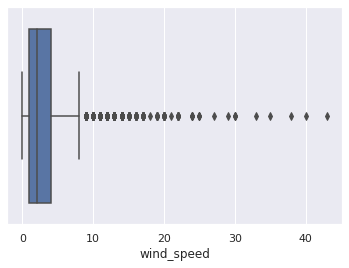

In [45]:
# Check for outliers in 'wind_speed' column again

sns.boxplot(x=df_weather['wind_speed'])
plt.show()

In [46]:
# Fill null values using interpolation

df_weather.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

Semuanya terlihat bagus dan bersih dan df_weather juga siap digunakan sebagai masukan untuk model kita. Kami juga harus memplot kolom 'rain_1h' dan 'rain_3h', karena kami telah menunjukkan bahwa setidaknya salah satunya (mungkin 'rain_3h') cukup bermasalah. Namun demikian, kami akan melakukannya setelah kami menggabungkan dua dataset.

## Merging the two datasets

In [47]:
# Split the df_weather into 5 dataframes (one for each city)

df_1, df_2, df_3, df_4, df_5 = [x for _, x in df_weather.groupby('city_name')]
dfs = [df_1, df_2, df_3, df_4, df_5]


In [48]:
# Merge all dataframes into the final dataframe

df_final = df_energy

for df in dfs:
    city = df['city_name'].unique()
    city_str = str(city).replace("'", "").replace('[', '').replace(']', '').replace(' ', '')
    df = df.add_suffix('_{}'.format(city_str))
    df_final = df_final.merge(df, on=['time'], how='outer')
    df_final = df_final.drop('city_name_{}'.format(city_str), axis=1)
    
df_final.columns

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load actual',
       'price day ahead', 'price actual', 'temp_Barcelona',
       'temp_min_Barcelona', 'temp_max_Barcelona', 'pressure_Barcelona',
       'humidity_Barcelona', 'wind_speed_Barcelona', 'wind_deg_Barcelona',
       'rain_1h_Barcelona', 'rain_3h_Barcelona', 'snow_3h_Barcelona',
       'clouds_all_Barcelona', 'temp_Bilbao', 'temp_min_Bilbao',
       'temp_max_Bilbao', 'pressure_Bilbao', 'humidity_Bilbao',
       'wind_speed_Bilbao', 'wind_deg_Bilbao', 'rain_1h_Bilbao',
       'rain_3h_Bilbao', 'snow_3h_Bilbao', 'clo

In [49]:
# Display the number of NaNs and duplicates in the final dataframe

print('There are {} missing values or NaNs in df_final.'
      .format(df_final.isnull().values.sum()))

temp_final = df_final.duplicated(keep='first').sum()

print('\nThere are {} duplicate rows in df_energy based on all columns.'
      .format(temp_final))

There are 0 missing values or NaNs in df_final.

There are 0 duplicate rows in df_energy based on all columns.


# Visualizations and Time Series Analysis

1. Useful visualizations and insights

Sebelum hal lain, kami akan memeriksa kolom 'rain_1h' dan 'rain_3h' untuk kota tertentu.

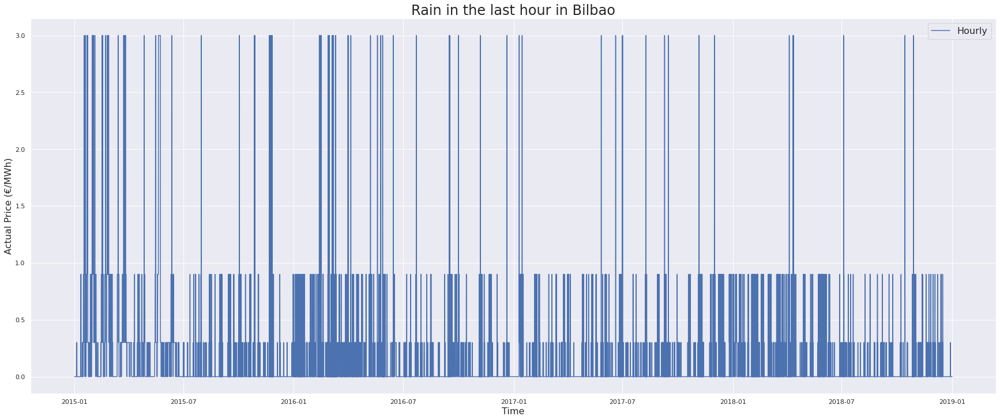

In [50]:
# Plot the 'rain_1h' for Bilbao

ax = plot_series(df_final, 'rain_1h_Bilbao', 
                 label='Hourly', ylabel='Actual Price (€/MWh)',
                 title='Rain in the last hour in Bilbao')
plt.show()

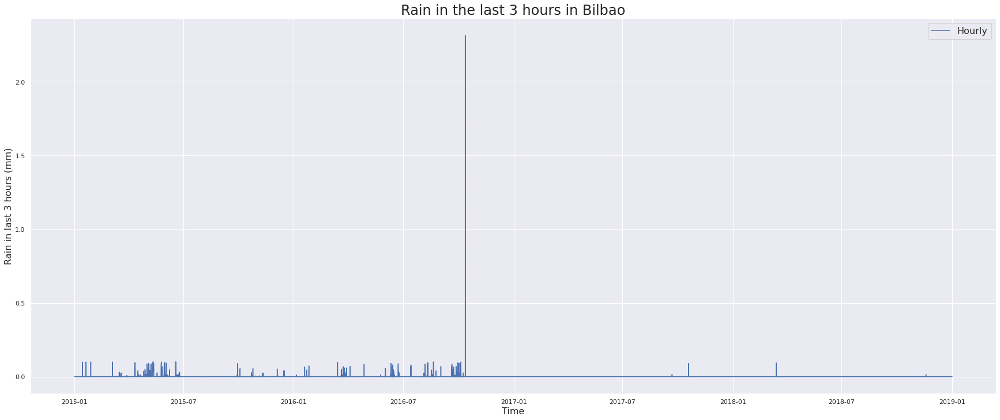

In [51]:
# Plot the 'rain_3h' for Bilbao

ax = plot_series(df_final, 'rain_3h_Bilbao', 
                 label='Hourly', ylabel='Rain in last 3 hours (mm)',
                 title='Rain in the last 3 hours in Bilbao')
plt.show()

Dari dua gambar di atas, kita dapat menyimpulkan bahwa 'rain_3h' adalah fitur yang tidak dapat diandalkan yang akan dihapus dari dataset.

In [52]:
cities = ['Barcelona', 'Bilbao', 'Madrid', 'Seville', 'Valencia']

for city in cities:
    df_final = df_final.drop(['rain_3h_{}'.format(city)], axis=1)

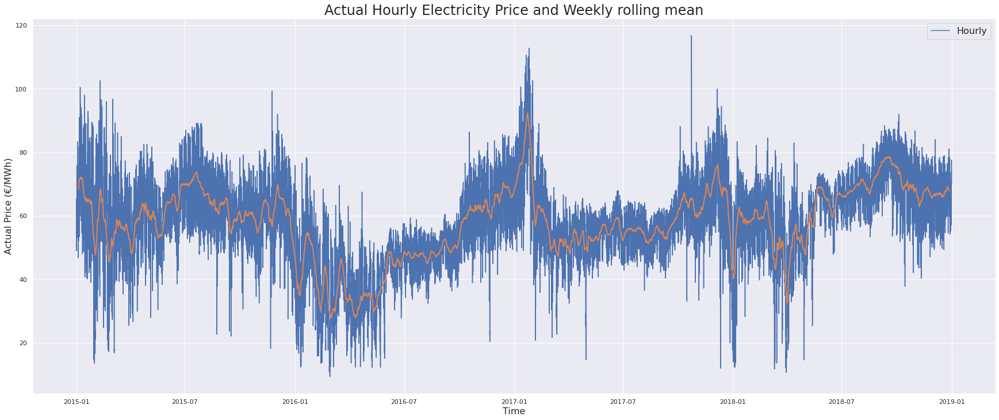

In [53]:
# Plot the hourly actual electricity price, along with the weekly rolling mean

rolling = df_final['price actual'].rolling(24*7, center=True).mean()
ax = plot_series(df_final, 'price actual', label='Hourly', ylabel='Actual Price (€/MWh)',
                 title='Actual Hourly Electricity Price and Weekly rolling mean')
ax.plot(rolling, linestyle='-', linewidth=2, label='Weekly rolling mean')
plt.show()

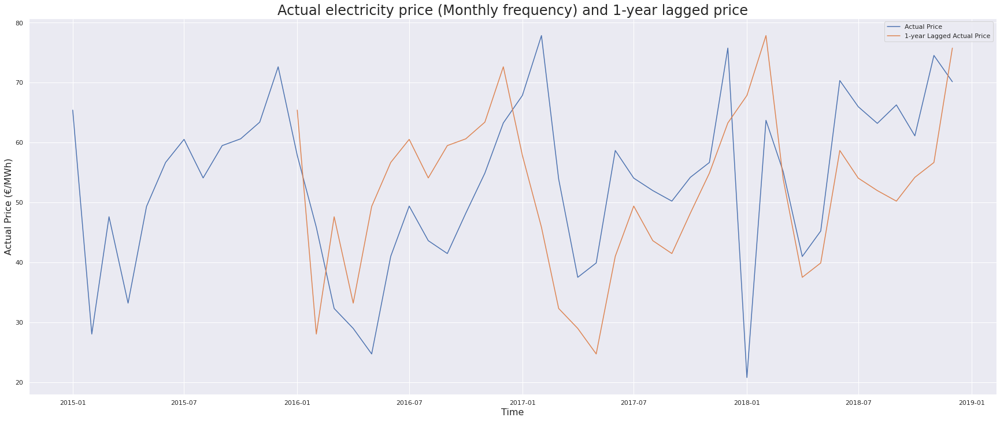

In [54]:
# Plot the electricity price (monthly frequence) along with its 1-year lagged series

monthly_price = df_final['price actual'].asfreq('M')
ax = plot_series(series=monthly_price, ylabel='Actual Price (€/MWh)',
                 title='Actual electricity price (Monthly frequency) and 1-year lagged price')
shifted = df_final['price actual'].asfreq('M').shift(12)
ax.plot(shifted, label='Hourly')
ax.legend(['Actual Price', '1-year Lagged Actual Price'])
plt.show()

Gambar di atas menunjukkan frekuensi bulanan (disampel ulang) dari harga listrik aktual, bersama dengan frekuensi bulanan tertinggal 1 tahun. Dari sini, kita dapat melihat bahwa memang ada pola musiman pada skala bulanan, karena "lonjakan" tertentu dalam deret waktu terjadi pada bulan-bulan yang persis sama. Ini berarti ide yang bagus untuk membuat fitur baru selama berbulan-bulan. Jika angka tersebut menunjukkan harga energi aktual tertinggal 1 tahun pada skala waktu per jam atau mingguan, kita -tentu saja- tidak akan melihat pola musiman seperti itu.

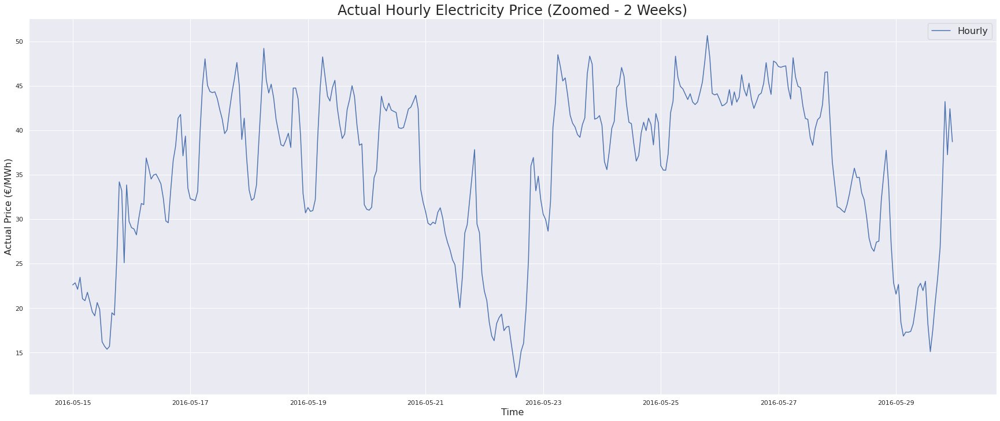

In [55]:
# Plot the actual electricity price at a daily/weekly scale

ax = plot_series(df_final, 'price actual', label='Hourly', ylabel='Actual Price (€/MWh)',
                 start=1 + 24 * 500, end=1 + 24 * 515,
                 title='Actual Hourly Electricity Price (Zoomed - 2 Weeks)')
plt.show()

Pada gambar di atas, kami telah memplot harga listrik per jam aktual dari 15/06/2016 (Minggu) pukul 00:00 hingga 29/06/2016 (Minggu) pukul 23:00, yaitu data dua minggu. Kita dapat mengamati bahwa ada banyak pola dan periodisitas, seperti:

- Periode dari minggu ke minggu, karena harga listrik cenderung lebih tinggi pada hari kerja dan lebih rendah selama akhir pekan dan terutama pada hari Minggu.

- Periodisitas intradyay, karena harga lebih tinggi di siang hari dan lebih rendah di malam hari.

- Sebuah periodisitas dalam jam kerja, seperti dalam beberapa kasus harga listrik turun selama beberapa jam, yang mungkin karena "siesta", istirahat makan siang tradisional antara 13:30 dan 16:30, karena Spanyol tidak secara ketat mengikuti jam 9 pagi -5 sore hari kerja.

Nantinya, kami akan memastikan bahwa kami akan menghasilkan fitur yang berisi informasi semacam ini.

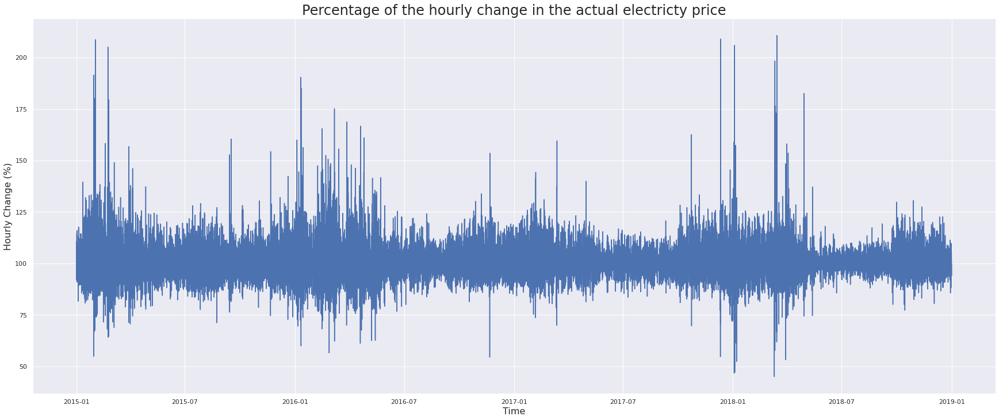

In [56]:
# Plot the percentage of the hourly change in the actual electricity price

change = df_energy['price actual'].div(df_energy['price actual'].shift(1)).mul(100)
ax = plot_series(series=change, ylabel='Hourly Change (%)', 
                 title='Percentage of the hourly change in the actual electricty price')
plt.show()

Dari gambar di atas, kita dapat melihat bahwa perubahan harga aktual dari jam ke jam biasanya terjadi antara -25% (harga aktual * 0,75) dan +25% (harga aktual * 1,25). Namun, ada juga sangat sedikit outlier yang menunjukkan bahwa harga menjadi setengahnya (-50%) atau dua kali lipat (+100%).

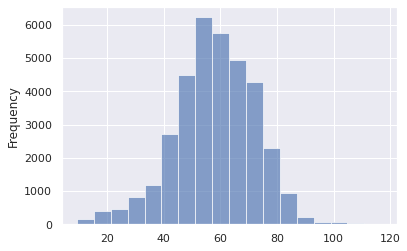

In [57]:
# Plot the histogram of the actual electricity price

ax = df_energy['price actual'].plot.hist(bins=18, alpha=0.65)

Pada gambar di atas, kita dapat melihat bahwa harga energi aktual secara kasar mengikuti distribusi normal dan dengan demikian, dapat distandarisasi. Namun, kita juga harus memastikan bahwa deret waktu tidak memerlukan jenis transformasi lainnya. Lebih khusus lagi, kami akan memeriksa apakah deret waktu harga energi stasioner, setelah memvisualisasikan deret waktu komponen yang terurai.

2. Decomposition and stationarity tests

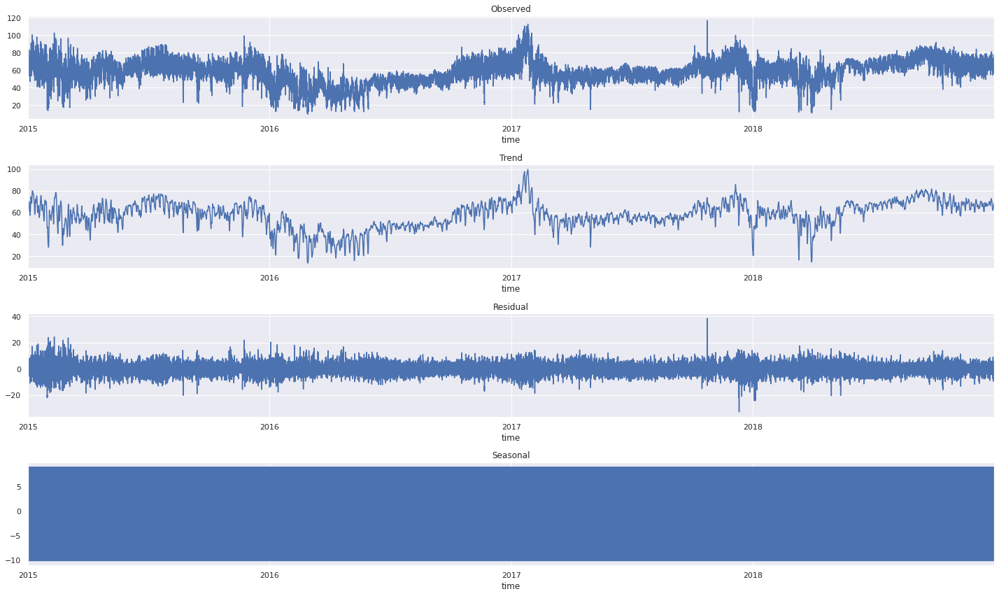

In [58]:
# Decompose the electricity price time series

res = sm.tsa.seasonal_decompose(df_energy['price actual'], model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
res.resid.plot(ax=ax3, title='Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

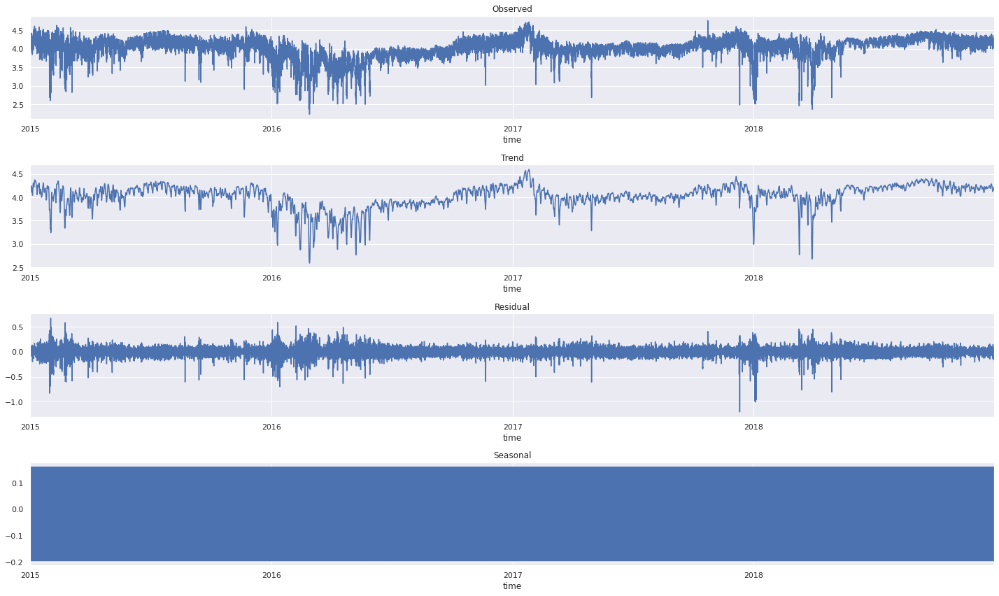

In [59]:
# Decompose the log electricity price time-series

res = sm.tsa.seasonal_decompose(np.log(df_energy['price actual']), model='additive')

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(20, 12))
res.observed.plot(ax=ax1, title='Observed')
res.trend.plot(ax=ax2, title='Trend')
res.resid.plot(ax=ax3, title='Residual')
res.seasonal.plot(ax=ax4, title='Seasonal')
plt.tight_layout()
plt.show()

Tes Augmented Dickey-Fuller (ADF), sejenis tes akar unit, menentukan seberapa kuat deret waktu ditentukan oleh tren. Hipotesisnya adalah sebagai berikut:

- Hipotesis Null H0H0 : Ada akar unit dalam deret waktu, yaitu deret tersebut berkorelasi otomatis dengan (r=1), struktur yang bergantung waktu dan dengan demikian, tidak stasioner.

- Hipotesis Alternatif H1H1 : Deret waktu tidak memiliki akar satuan dan stasioner atau dapat dibuat stasioner menggunakan differencing.

In [60]:
y = df_final['price actual']
adf_test = adfuller(y, regression='c')
print('ADF Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(adf_test[0], adf_test[1], adf_test[2]))
for key, value in adf_test[4].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

ADF Statistic: -9.147016
p-value: 0.000000
#Lags used: 50
Critical Value (1%): -3.430537
Critical Value (5%): -2.861623
Critical Value (10%): -2.566814


Statistik ADF (-9.147) lebih kecil dari nilai kritis pada 1% (-3.431) dan dengan demikian, kita dapat mengatakan bahwa kita menolak hipotesis nol H0H0 dengan tingkat signifikansi 1%, artinya tidak ada unit akar dalam deret waktu dan dengan demikian, apakah itu stasioner atau dapat dibuat stasioner dengan differencing orde 1 (difference-stationary).

Tes Kwiatkowski-Phillips-Schmidt-Shin (KPSS), mengikuti logika yang berlawanan dari tes Augmented Dickey-Fuller dan memeriksa stasioneritas. Hipotesisnya adalah sebagai berikut:

- Hipotesis Null H0 : Deret waktu adalah level, yaitu stasioner di sekitar konstanta.
- Hipotesis Alternatif H1: Ada akar unit dalam deret waktu dan karenanya tidak stasioner.

In [61]:
kpss_test = kpss(y, regression='c', lags='legacy')
print('KPSS Statistic: {:.6f}\np-value: {:.6f}\n#Lags used: {}'
      .format(kpss_test[0], kpss_test[1], kpss_test[2]))
for key, value in kpss_test[3].items():
    print('Critical Value ({}): {:.6f}'.format(key, value))

KPSS Statistic: 7.957007
p-value: 0.010000
#Lags used: 52
Critical Value (10%): 0.347000
Critical Value (5%): 0.463000
Critical Value (2.5%): 0.574000
Critical Value (1%): 0.739000


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)


Statistik KPSS (7,957) lebih tinggi dari nilai kritis pada 1% (0,739) dan dengan demikian, kita dapat mengatakan bahwa kita tidak dapat menolak hipotesis nol H0H0 dengan tingkat signifikansi 1%, artinya deret waktu stasioner atau stasioner di sekitar a konstan.

Kedua tes menyimpulkan bahwa deret waktu harga listrik adalah stasioner, sementara itu juga benar bahwa jaringan saraf dalam dapat menangani properti tersebut dengan cara yang lebih memaafkan dibandingkan dengan model ARIMA.

3. Autocorrelation, partial autocorrelation and cross-correlation

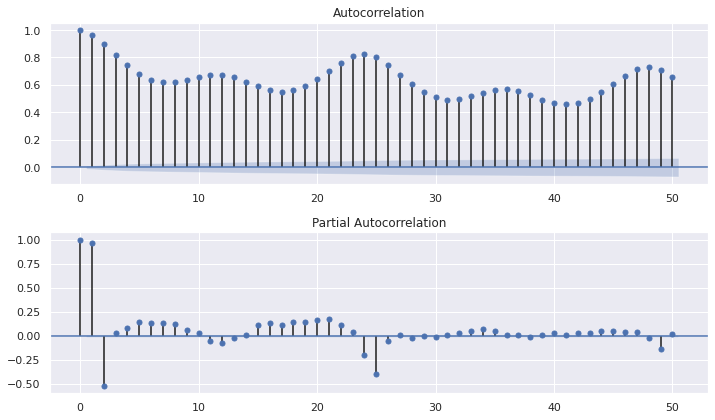

In [62]:
# Plot autocorrelation and partial autocorrelation plots

fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 6))
plot_acf(df_final['price actual'], lags=50, ax=ax1)
plot_pacf(df_final['price actual'], lags=50, ax=ax2)
plt.tight_layout()
plt.show()

Plot autokorelasi parsial dari deret waktu harga listrik menunjukkan bahwa hubungan langsung antara pengamatan pada jam tertentu (t) paling kuat dengan pengamatan pada langkah waktu t-1, t-2, t-24 dan t-25 dan berkurang setelahnya. Jadi, kita akan menggunakan 25 nilai sebelumnya dari setiap deret waktu yang akan menjadi fitur untuk model kita.

Namun demikian, akan lebih menguntungkan jika kita hanya memilih untuk menggunakan nilai masa lalu tertentu (pengamatan pada jeda waktu tertentu) dari fitur tertentu, berdasarkan korelasi silang antara harga listrik dan masing-masing fitur dalam dataset. . Sebagai contoh, di bawah ini kita dapat melihat korelasi silang antara harga listrik dan total beban. Kami melihat bahwa ada banyak jeda waktu dengan korelasi yang mendekati nol dan dapat dihilangkan.

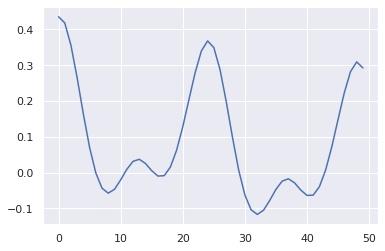

In [63]:
cross_corr = ccf(df_final['total load actual'], df_final['price actual'])
plt.plot(cross_corr[0:50])
plt.show()

Untuk mempermudah, kami hanya akan bekerja dengan korelasi antara harga listrik dan fitur lainnya pada setiap jam tertentu.

In [64]:
# Find the correlations between the electricity price and the rest of the features

correlations = df_final.corr(method='pearson')
print(correlations['price actual'].sort_values(ascending=False).to_string())

price actual                                   1.000000
price day ahead                                0.732155
generation fossil hard coal                    0.465637
generation fossil gas                          0.461452
total load actual                              0.435253
generation fossil brown coal/lignite           0.363993
generation fossil oil                          0.285050
generation other renewable                     0.255551
pressure_Barcelona                             0.249177
pressure_Bilbao                                0.194063
generation waste                               0.168710
generation biomass                             0.142671
temp_min_Valencia                              0.133141
pressure_Valencia                              0.109812
temp_min_Barcelona                             0.103726
generation other                               0.099914
generation solar                               0.098529
temp_max_Madrid                                0

Dari penjelasan di atas, kita sudah dapat melihat beberapa korelasi yang sangat menarik antara harga energi yang ingin kita prediksi dan fitur-fitur lainnya. Misalnya, total beban energi dan jumlah energi yang dihasilkan dari sumber yang terkait dengan bahan bakar fosil, berkorelasi positif dengan harga listrik. Sebaliknya, kecepatan angin di hampir setiap kota dan jumlah energi penyimpanan yang dikonsumsi melalui pemompaan PLTA berkorelasi negatif dengan harga energi. Kami akan melanjutkan dan menjatuhkan 'snow_3h_Barcelona' dan 'snow_3h_Seville' yang memberikan NaN dalam korelasinya dengan harga aktual listrik.

In [65]:
df_final = df_final.drop(['snow_3h_Barcelona', 'snow_3h_Seville'], axis=1)

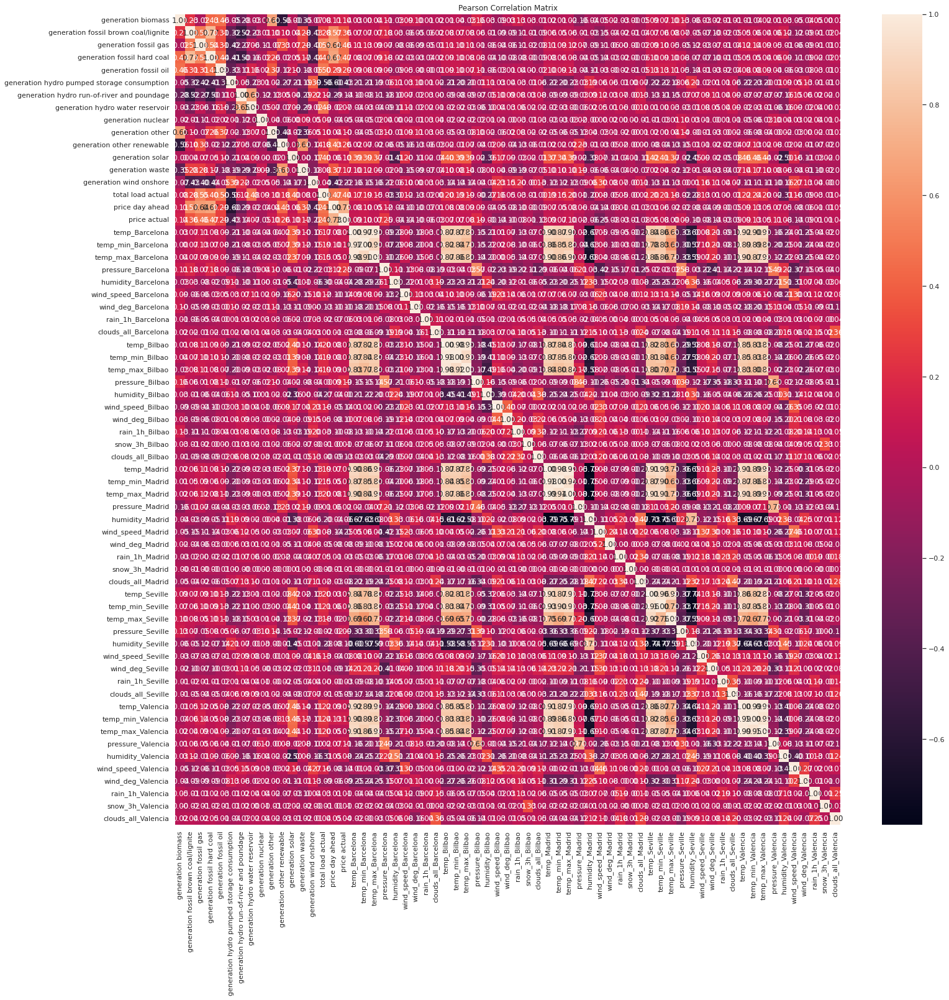

In [66]:
# Plot Pearson correlation matrix

correlations = df_final.corr(method='pearson')
fig = plt.figure(figsize=(24, 24))
sns.heatmap(correlations, annot=True, fmt='.2f')
plt.title('Pearson Correlation Matrix')
plt.show()

Meskipun kami tidak dapat membuat banyak dari matriks korelasi di atas, kami dapat mengamati bahwa ada cukup banyak fitur yang sangat berkorelasi satu sama lain.

In [67]:
highly_correlated = abs(correlations[correlations > 0.75])
print(highly_correlated[highly_correlated < 1.0].stack().to_string())

generation fossil brown coal/lignite  generation fossil hard coal             0.768831
generation fossil hard coal           generation fossil brown coal/lignite    0.768831
temp_Barcelona                        temp_min_Barcelona                      0.970264
                                      temp_max_Barcelona                      0.976904
                                      temp_Bilbao                             0.866727
                                      temp_min_Bilbao                         0.867970
                                      temp_max_Bilbao                         0.828347
                                      temp_Madrid                             0.903996
                                      temp_min_Madrid                         0.874548
                                      temp_max_Madrid                         0.899010
                                      temp_Seville                            0.841910
                                      temp_

Apa yang dapat kita amati, adalah bahwa selain jumlah energi yang dihasilkan oleh fosil batubara coklat/lignit dan batubara keras, fitur yang paling berkorelasi berkaitan dengan suhu di antara kota-kota yang berbeda, serta informasi "sekunder" yang kita miliki tentang suhu masing-masing kota (yaitu suhu minimum dan maksimum).

##Feature Engineering

1. Feature generation

Fitur pertama yang akan kami hasilkan untuk jam tertentu hanyalah jam tertentu, hari dan bulan di mana ia masuk.

In [68]:
# Generate 'hour', 'weekday' and 'month' features

for i in range(len(df_final)):
    position = df_final.index[i]
    hour = position.hour
    weekday = position.weekday()
    month = position.month
    df_final.loc[position, 'hour'] = hour
    df_final.loc[position, 'weekday'] = weekday
    df_final.loc[position, 'month'] = month

Fitur yang sangat berguna yang akan kami hasilkan, berkaitan dengan jam kerja, yaitu apakah bisnis buka atau tidak pada jam tertentu. Namun, ada keanehan tertentu di Spanyol karena hari kerja pukul 09.00-17.00 umumnya tidak diikuti oleh semua jenis bisnis, karena istirahat makan siang (dikenal sebagai "siesta") di antaranya. Jam kerja yang paling biasa adalah dari Senin-Sabtu, dari 09:30-13:30 dan kemudian lagi dari 16:30-20:00.

Oleh karena itu, nilai 'jam kerja' akan sama dengan '2' jika jam tersebut berada dalam jam kerja, sama dengan '1' jika jam tersebut berada dalam "siesta" di antara dan sama dengan '0' untuk semua jam lain yang diberikan.

In [69]:
# Generate 'business hour' feature

for i in range(len(df_final)):
    position = df_final.index[i]
    hour = position.hour
    if ((hour > 8 and hour < 14) or (hour > 16 and hour < 21)):
        df_final.loc[position, 'business hour'] = 2
    elif (hour >= 14 and hour <= 16):
        df_final.loc[position, 'business hour'] = 1
    else:
        df_final.loc[position, 'business hour'] = 0

Namun, kami telah membuat fitur 'jam kerja' sedemikian rupa yang juga mencakup akhir pekan, di mana lebih sedikit -atau berbagai jenis bisnis yang buka. Oleh karena itu, berguna juga untuk membuat fitur lain, 'akhir pekan', yang akan membedakan hari kerja dan akhir pekan, serta membuat perbedaan antara hari Sabtu dan Minggu.

Khususnya, untuk jam tertentu, nilai 'akhir pekan' akan sama dengan '0', jika jamnya dalam hari kerja, sama dengan '1' jika jamnya di hari Sabtu dan sama dengan '2' jika jamnya di hari minggu.

In [70]:
# Generate 'weekend' feature

for i in range(len(df_final)):
    position = df_final.index[i]
    weekday = position.weekday()
    if (weekday == 6):
        df_final.loc[position, 'weekday'] = 2
    elif (weekday == 5):
        df_final.loc[position, 'weekday'] = 1
    else:
        df_final.loc[position, 'weekday'] = 0

Untuk mengurangi dimensi dan berpotensi memperoleh jenis informasi baru, untuk setiap jam tertentu, kami akan mengurangi suhu minimum ('temp_min') dari suhu maksimum ('temp_max') untuk setiap kota dan kami akan memberi nama fitur itu ' temprange{nama kota}'.

In [71]:
# Generate 'temp_range' for each city

cities = ['Barcelona', 'Bilbao', 'Madrid', 'Seville', 'Valencia']

for i in range(len(df_final)):
    position = df_final.index[i]
    for city in cities:
        temp_max = df_final.loc[position, 'temp_max_{}'.format(city)]
        temp_min = df_final.loc[position, 'temp_min_{}'.format(city)]
        df_final.loc[position, 'temp_range_{}'.format(city)] = abs(temp_max - temp_min)

Setelah melihat adanya korelasi yang tinggi antara suhu kota yang berbeda, kami juga akan mencoba membuat fitur suhu berbobot dengan mempertimbangkan populasi masing-masing kota.
- Madrid: 6.155.116
- Barcelona: 5.179.243
- Valencia: 1.645.342
- Sevilla: 1.305.342
- Bilbao: 987.000

In [72]:
# Calculate the weight of every city

total_pop = 6155116 + 5179243 + 1645342 + 1305342 + 987000

weight_Madrid = 6155116 / total_pop
weight_Barcelona = 5179243 / total_pop
weight_Valencia = 1645342 / total_pop
weight_Seville = 1305342 / total_pop
weight_Bilbao = 987000 / total_pop

In [73]:
cities_weights = {'Madrid': weight_Madrid, 
                  'Barcelona': weight_Barcelona,
                  'Valencia': weight_Valencia,
                  'Seville': weight_Seville,
                  'Bilbao': weight_Bilbao}

In [74]:
# Generate 'temp_weighted' feature

for i in range(len(df_final)):
    position = df_final.index[i]
    temp_weighted = 0
    for city in cities:
        temp = df_final.loc[position, 'temp_{}'.format(city)]
        temp_weighted += temp * cities_weights.get('{}'.format(city))
    df_final.loc[position, 'temp_weighted'] = temp_weighted

Kami juga akan menghasilkan fitur baru yang menggabungkan kedua sumber energi yang terkait dengan batubara dan berkorelasi tinggi (0,7688).

In [75]:
df_final['generation coal all'] = df_final['generation fossil hard coal'] + df_final['generation fossil brown coal/lignite']

2. Feature Selection

In [76]:
def multivariate_data(dataset, target, start_index, end_index, history_size,
                      target_size, step, single_step=False):
    data = []
    labels = []

    start_index = start_index + history_size
    if end_index is None:
        end_index = len(dataset) - target_size
        
    for i in range(start_index, end_index):
        indices = range(i-history_size, i, step)
        data.append(dataset[indices])
        
        if single_step:
            labels.append(target[i + target_size])
        else:
            labels.append(target[i : i + target_size])

    return np.array(data), np.array(labels)

In [77]:
train_end_idx = 27048
cv_end_idx = 31056
test_end_idx = 35064

In [78]:
X = df_final[df_final.columns.drop('price actual')].values
y = df_final['price actual'].values

y = y.reshape(-1, 1)

In [79]:
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

In [80]:
scaler_X.fit(X[:train_end_idx])
scaler_y.fit(y[:train_end_idx])

MinMaxScaler(copy=True, feature_range=(0, 1))

In [81]:
X_norm = scaler_X.transform(X)
y_norm = scaler_y.transform(y)

In [82]:
pca = PCA()
X_pca = pca.fit(X_norm[:train_end_idx])

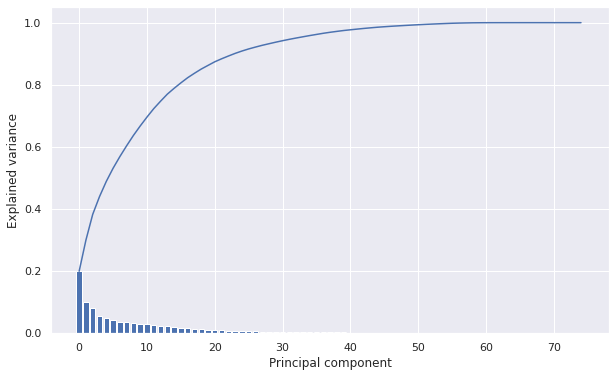

In [83]:
num_components = len(pca.explained_variance_ratio_)
plt.figure(figsize=(10, 6))
plt.bar(np.arange(num_components), pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal component')
plt.ylabel('Explained variance')
plt.show()

In [84]:
pca = PCA(n_components=0.80)
pca.fit(X_norm[:train_end_idx])
X_pca = pca.transform(X_norm)

In [85]:
X_pca.shape

(35064, 16)

In [86]:
dataset_norm = np.concatenate((X_pca, y_norm), axis=1)

past_history = 24
future_target = 0

In [87]:
X_train, y_train = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                     0, train_end_idx, past_history, 
                                     future_target, step=1, single_step=True)

In [88]:
X_val, y_val = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                 train_end_idx, cv_end_idx, past_history, 
                                 future_target, step=1, single_step=True)

In [89]:
X_test, y_test = multivariate_data(dataset_norm, dataset_norm[:, -1],
                                   cv_end_idx, test_end_idx, past_history, 
                                   future_target, step=1, single_step=True)

In [90]:
batch_size = 32
buffer_size = 1000

In [91]:
train = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train = train.cache().shuffle(buffer_size).batch(batch_size).prefetch(1)

validation = tf.data.Dataset.from_tensor_slices((X_val, y_val))
validation = validation.batch(batch_size).prefetch(1)

In [92]:
# Define some common parameters

input_shape = X_train.shape[-2:]
loss = tf.keras.losses.MeanSquaredError()
metric = [tf.keras.metrics.RootMeanSquaredError()]
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
              lambda epoch: 1e-4 * 10**(epoch / 10))
early_stopping = tf.keras.callbacks.EarlyStopping(patience=10)

In [93]:
y_test = y_test.reshape(-1, 1)
y_test_inv = scaler_y.inverse_transform(y_test)

4. Electricity Price Forecasting

In [94]:
def plot_model_rmse_and_loss(history):
    
    # Evaluate train and validation accuracies and losses
    
    train_rmse = history.history['root_mean_squared_error']
    val_rmse = history.history['val_root_mean_squared_error']
    
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    
     # Visualize epochs vs. train and validation accuracies and losses
    
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.plot(train_rmse, label='Training RMSE')
    plt.plot(val_rmse, label='Validation RMSE')
    plt.legend()
    plt.title('Epochs vs. Training and Validation RMSE')
    
    plt.subplot(1, 2, 2)
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend()
    plt.title('Epochs vs. Training and Validation Loss')
    
    plt.show()

1. LSTM

In [95]:
tf.keras.backend.clear_session()

multivariate_lstm = tf.keras.models.Sequential([
    LSTM(100, input_shape=input_shape, 
         return_sequences=True),
    Flatten(),
    Dense(200, activation='relu'),
    Dropout(0.1),
    Dense(1)
])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_lstm.h5', monitor=('val_loss'), save_best_only=True)
optimizer = tf.keras.optimizers.Adam(lr=6e-3, amsgrad=True)

multivariate_lstm.compile(loss=loss,
                          optimizer=optimizer,
                          metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [97]:
history = multivariate_lstm.fit(train, epochs=120,
                                validation_data=validation,
                                callbacks=[early_stopping, 
                                           model_checkpoint])

Epoch 1/120
845/845 [==============================] - 24s 29ms/step - loss: 5.8340e-04 - root_mean_squared_error: 0.0242 - val_loss: 5.9552e-04 - val_root_mean_squared_error: 0.0244
Epoch 2/120
845/845 [==============================] - 24s 28ms/step - loss: 5.7873e-04 - root_mean_squared_error: 0.0241 - val_loss: 5.8713e-04 - val_root_mean_squared_error: 0.0242
Epoch 3/120
845/845 [==============================] - 23s 27ms/step - loss: 5.9650e-04 - root_mean_squared_error: 0.0244 - val_loss: 5.9184e-04 - val_root_mean_squared_error: 0.0243
Epoch 4/120
845/845 [==============================] - 24s 29ms/step - loss: 5.8809e-04 - root_mean_squared_error: 0.0243 - val_loss: 5.7948e-04 - val_root_mean_squared_error: 0.0241
Epoch 5/120
845/845 [==============================] - 24s 28ms/step - loss: 5.9040e-04 - root_mean_squared_error: 0.0243 - val_loss: 6.0478e-04 - val_root_mean_squared_error: 0.0246
Epoch 6/120
845/845 [==============================] - 24s 28ms/step - loss: 5.8311e-

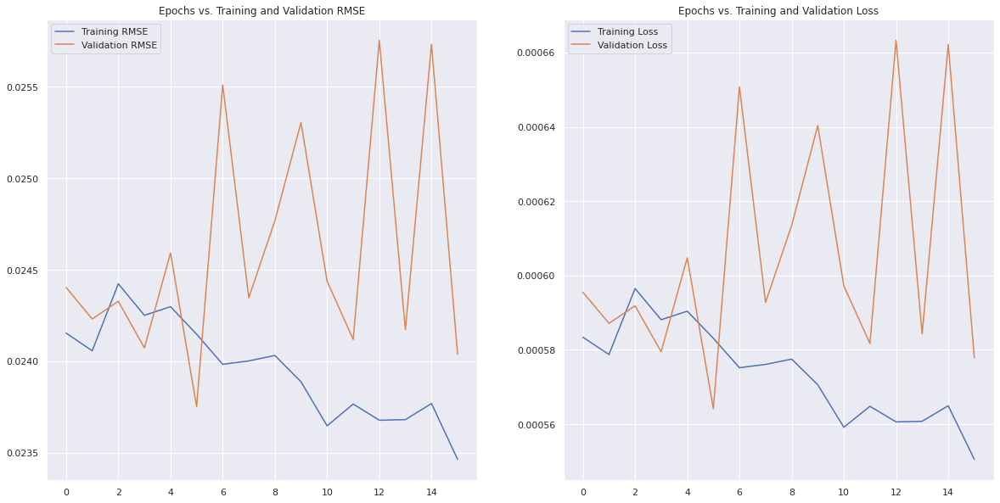

In [98]:
plot_model_rmse_and_loss(history)

In [99]:
multivariate_lstm = tf.keras.models.load_model('multivariate_lstm.h5')

forecast = multivariate_lstm.predict(X_test)
lstm_forecast = scaler_y.inverse_transform(forecast)

rmse_lstm = sqrt(mean_squared_error(y_test_inv,
                                    lstm_forecast))
print('RMSE of hour-ahead electricity price LSTM forecast: {}'
      .format(round(rmse_lstm, 3)))

RMSE of hour-ahead electricity price LSTM forecast: 2.236


In [100]:
tf.keras.backend.clear_session()

multivariate_stacked_lstm = tf.keras.models.Sequential([
    LSTM(250, input_shape=input_shape, 
         return_sequences=True),
    LSTM(150, return_sequences=True),
    Flatten(),
    Dense(150, activation='relu'),
    Dropout(0.1),
    Dense(1)
])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_stacked_lstm.h5', save_best_only=True)
optimizer = tf.keras.optimizers.Adam(lr=3e-3, amsgrad=True)

multivariate_stacked_lstm.compile(loss=loss,
                                  optimizer=optimizer,
                                  metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [101]:
history = multivariate_stacked_lstm.fit(train, epochs=120,
                                validation_data=validation,
                                callbacks=[early_stopping, 
                                           model_checkpoint])

Epoch 1/120
845/845 [==============================] - 132s 152ms/step - loss: 0.0200 - root_mean_squared_error: 0.1324 - val_loss: 0.0063 - val_root_mean_squared_error: 0.0794
Epoch 2/120
845/845 [==============================] - 130s 154ms/step - loss: 0.0040 - root_mean_squared_error: 0.0630 - val_loss: 0.0038 - val_root_mean_squared_error: 0.0616
Epoch 3/120
845/845 [==============================] - 130s 154ms/step - loss: 0.0029 - root_mean_squared_error: 0.0541 - val_loss: 0.0030 - val_root_mean_squared_error: 0.0550
Epoch 4/120
845/845 [==============================] - 130s 154ms/step - loss: 0.0022 - root_mean_squared_error: 0.0472 - val_loss: 0.0032 - val_root_mean_squared_error: 0.0568
Epoch 5/120
845/845 [==============================] - 125s 148ms/step - loss: 0.0019 - root_mean_squared_error: 0.0436 - val_loss: 0.0021 - val_root_mean_squared_error: 0.0461
Epoch 6/120
845/845 [==============================] - 126s 149ms/step - loss: 0.0016 - root_mean_squared_error: 0.

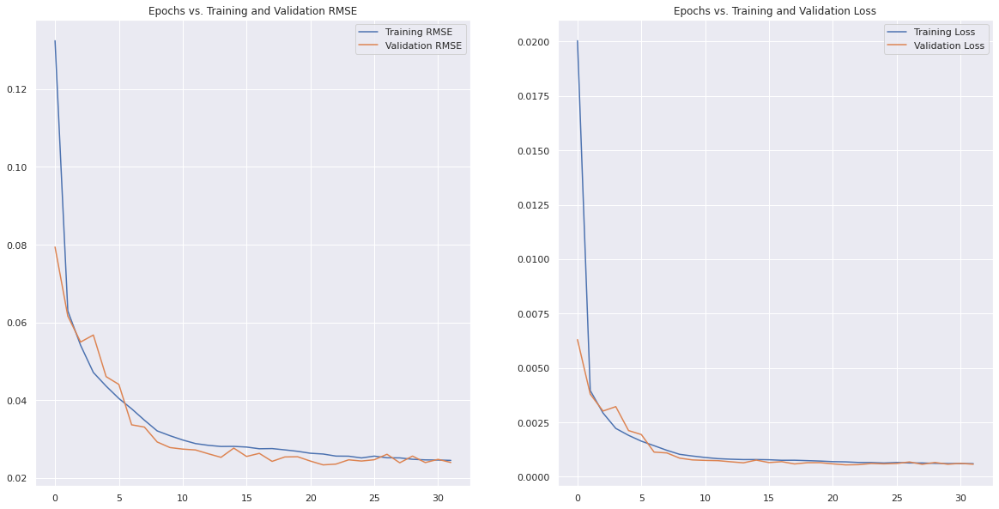

In [102]:
plot_model_rmse_and_loss(history)

In [105]:
multivariate_stacked_lstm = tf.keras.models.load_model('multivariate_stacked_lstm.h5')

forecast = multivariate_stacked_lstm.predict(X_test)
multivariate_stacked_lstm_forecast = scaler_y.inverse_transform(forecast)

rmse_mult_stacked_lstm = sqrt(mean_squared_error(y_test_inv, 
                                                 multivariate_stacked_lstm_forecast))
print('RMSE of hour-ahead electricity price multivariate Stacked LSTM forecast: {}'
      .format(round(rmse_mult_stacked_lstm, 3)))

RMSE of hour-ahead electricity price multivariate Stacked LSTM forecast: 2.209


##XGBoost

In [106]:
X_train_xgb = X_train.reshape(-1, X_train.shape[1] * X_train.shape[2])
X_val_xgb = X_val.reshape(-1, X_val.shape[1] * X_val.shape[2])
X_test_xgb = X_test.reshape(-1, X_test.shape[1] * X_test.shape[2])

In [107]:
param = {'eta': 0.03, 'max_depth': 180, 
         'subsample': 1.0, 'colsample_bytree': 0.95, 
         'alpha': 0.1, 'lambda': 0.15, 'gamma': 0.1,
         'objective': 'reg:linear', 'eval_metric': 'rmse', 
         'silent': 1, 'min_child_weight': 0.1, 'n_jobs': -1}

dtrain = xgb.DMatrix(X_train_xgb, y_train)
dval = xgb.DMatrix(X_val_xgb, y_val)
dtest = xgb.DMatrix(X_test_xgb, y_test)
eval_list = [(dtrain, 'train'), (dval, 'eval')]

xgb_model = xgb.train(param, dtrain, 180, eval_list, early_stopping_rounds=3)

[0]	train-rmse:0.144136	eval-rmse:0.117006
Multiple eval metrics have been passed: 'eval-rmse' will be used for early stopping.

Will train until eval-rmse hasn't improved in 3 rounds.
[1]	train-rmse:0.140028	eval-rmse:0.11371
[2]	train-rmse:0.136049	eval-rmse:0.110503
[3]	train-rmse:0.132193	eval-rmse:0.107422
[4]	train-rmse:0.128457	eval-rmse:0.104417
[5]	train-rmse:0.124846	eval-rmse:0.101527
[6]	train-rmse:0.12134	eval-rmse:0.098681
[7]	train-rmse:0.117945	eval-rmse:0.095938
[8]	train-rmse:0.11466	eval-rmse:0.093297
[9]	train-rmse:0.111477	eval-rmse:0.090772
[10]	train-rmse:0.108396	eval-rmse:0.088281
[11]	train-rmse:0.105411	eval-rmse:0.085877
[12]	train-rmse:0.10252	eval-rmse:0.083553
[13]	train-rmse:0.099718	eval-rmse:0.081316
[14]	train-rmse:0.097013	eval-rmse:0.079143
[15]	train-rmse:0.094523	eval-rmse:0.077208
[16]	train-rmse:0.091977	eval-rmse:0.075181
[17]	train-rmse:0.089517	eval-rmse:0.073222
[18]	train-rmse:0.08714	eval-rmse:0.071311
[19]	train-rmse:0.084834	eval-rmse:0.

In [108]:
forecast = xgb_model.predict(dtest)
xgb_forecast = forecast.reshape(-1, 1)

xgb_forecast_inv = scaler_y.inverse_transform(xgb_forecast)

rmse_xgb = sqrt(mean_squared_error(y_test_inv, xgb_forecast_inv))
print('RMSE of hour-ahead electricity price XGBoost forecast: {}'
      .format(round(rmse_xgb, 3)))

RMSE of hour-ahead electricity price XGBoost forecast: 2.214


##CNN

In [109]:
tf.keras.backend.clear_session()

multivariate_cnn = tf.keras.models.Sequential([
    Conv1D(filters=48, kernel_size=2,
           strides=1, padding='causal',
           activation='relu', 
           input_shape=input_shape),
    Flatten(),
    Dense(48, activation='relu'),
    Dense(1)
])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_cnn.h5', save_best_only=True)
optimizer = tf.keras.optimizers.Adam(lr=6e-3, amsgrad=True)

multivariate_cnn.compile(loss=loss,
                          optimizer=optimizer,
                          metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [110]:
history = multivariate_cnn.fit(train, epochs=120,
                               validation_data=validation,
                               callbacks=[early_stopping, 
                                          model_checkpoint])

Epoch 1/120
845/845 [==============================] - 3s 3ms/step - loss: 0.0442 - root_mean_squared_error: 0.1965 - val_loss: 0.0130 - val_root_mean_squared_error: 0.1141
Epoch 2/120
845/845 [==============================] - 3s 4ms/step - loss: 0.0132 - root_mean_squared_error: 0.1150 - val_loss: 0.0129 - val_root_mean_squared_error: 0.1138
Epoch 3/120
845/845 [==============================] - 3s 3ms/step - loss: 0.0131 - root_mean_squared_error: 0.1143 - val_loss: 0.0128 - val_root_mean_squared_error: 0.1130
Epoch 4/120
845/845 [==============================] - 3s 3ms/step - loss: 0.0130 - root_mean_squared_error: 0.1142 - val_loss: 0.0128 - val_root_mean_squared_error: 0.1131
Epoch 5/120
845/845 [==============================] - 3s 4ms/step - loss: 0.0130 - root_mean_squared_error: 0.1140 - val_loss: 0.0127 - val_root_mean_squared_error: 0.1129
Epoch 6/120
845/845 [==============================] - 3s 4ms/step - loss: 0.0129 - root_mean_squared_error: 0.1138 - val_loss: 0.0128 

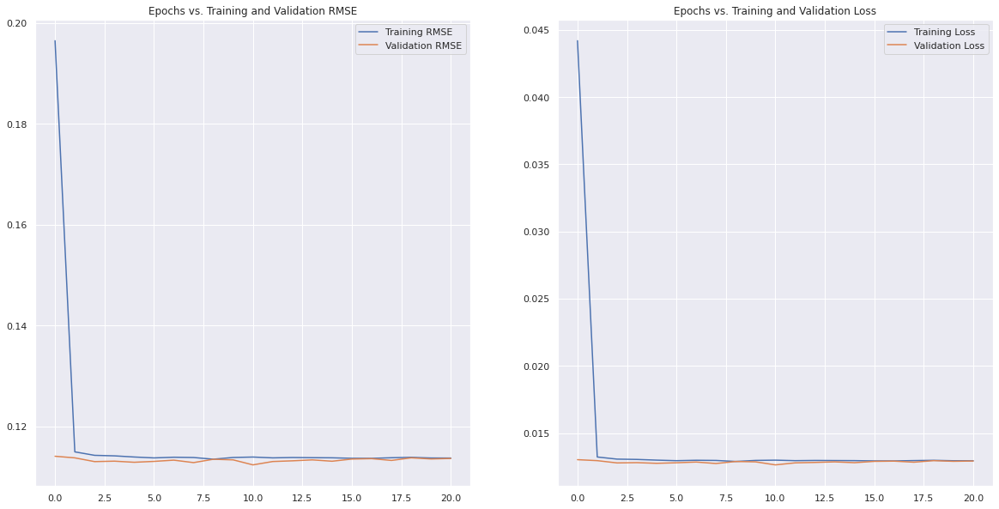

In [111]:
plot_model_rmse_and_loss(history)

In [112]:
multivariate_cnn = tf.keras.models.load_model('multivariate_cnn.h5')

forecast = multivariate_cnn.predict(X_test)
multivariate_cnn_forecast = scaler_y.inverse_transform(forecast)

rmse_mult_cnn = sqrt(mean_squared_error(y_test_inv,
                                        multivariate_cnn_forecast))
print('RMSE of hour-ahead electricity price multivariate CNN forecast: {}'
      .format(round(rmse_mult_cnn, 3)))

RMSE of hour-ahead electricity price multivariate CNN forecast: 13.061


##CNN-LSTM

In [113]:
tf.keras.backend.clear_session()

multivariate_cnn_lstm = tf.keras.models.Sequential([
    Conv1D(filters=100, kernel_size=2,
           strides=1, padding='causal',
           activation='relu', 
           input_shape=input_shape),
    LSTM(100, return_sequences=True),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(1)
])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_cnn_lstm.h5', save_best_only=True)
optimizer = tf.keras.optimizers.Adam(lr=4e-3, amsgrad=True)

multivariate_cnn_lstm.compile(loss=loss,
                          optimizer=optimizer,
                          metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [114]:
history = multivariate_cnn_lstm.fit(train, epochs=120,
                                    validation_data=validation,
                                    callbacks=[early_stopping, 
                                               model_checkpoint])

Epoch 1/120
845/845 [==============================] - 28s 31ms/step - loss: 0.0115 - root_mean_squared_error: 0.1080 - val_loss: 0.0052 - val_root_mean_squared_error: 0.0719
Epoch 2/120
845/845 [==============================] - 26s 31ms/step - loss: 0.0018 - root_mean_squared_error: 0.0429 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0488
Epoch 3/120
845/845 [==============================] - 26s 31ms/step - loss: 0.0013 - root_mean_squared_error: 0.0364 - val_loss: 0.0017 - val_root_mean_squared_error: 0.0415
Epoch 4/120
845/845 [==============================] - 26s 31ms/step - loss: 0.0010 - root_mean_squared_error: 0.0317 - val_loss: 0.0014 - val_root_mean_squared_error: 0.0373
Epoch 5/120
845/845 [==============================] - 26s 31ms/step - loss: 8.5436e-04 - root_mean_squared_error: 0.0292 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0329
Epoch 6/120
845/845 [==============================] - 26s 31ms/step - loss: 7.0727e-04 - root_mean_squared_error: 0.0266

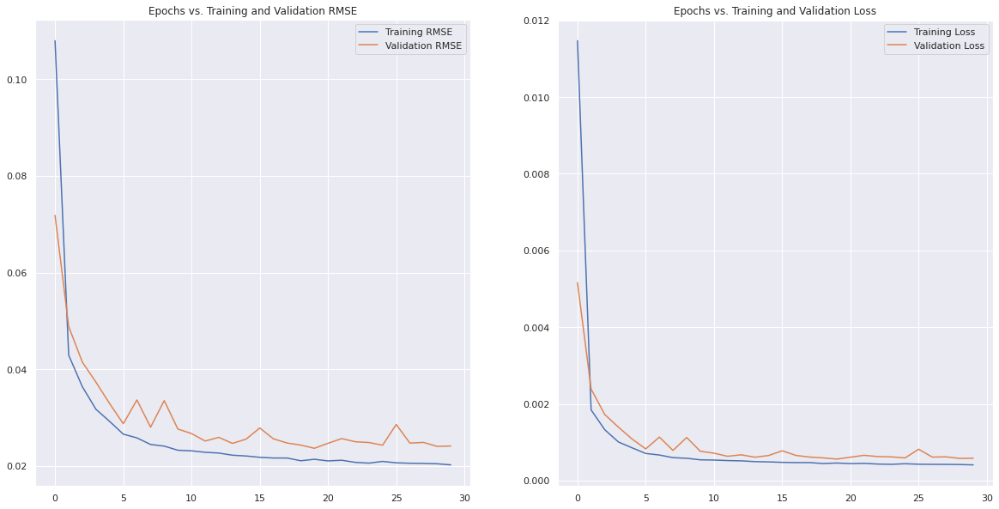

In [115]:
plot_model_rmse_and_loss(history)

In [116]:
multivariate_cnn_lstm = tf.keras.models.load_model('multivariate_cnn_lstm.h5')

forecast = multivariate_cnn_lstm.predict(X_test)
multivariate_cnn_lstm_forecast = scaler_y.inverse_transform(forecast)

rmse_mult_cnn_lstm = sqrt(mean_squared_error(y_test_inv, 
                                             multivariate_cnn_lstm_forecast))
print('RMSE of hour-ahead electricity price multivariate CNN-`LSTM forecast: {}'
      .format(round(rmse_mult_cnn_lstm, 3)))

RMSE of hour-ahead electricity price multivariate CNN-`LSTM forecast: 2.272


In [117]:
X_test.shape

(3984, 24, 17)

##Time Distributed MLP

In [118]:
tf.keras.backend.clear_session()

multivariate_mlp = tf.keras.models.Sequential([
    TimeDistributed(Dense(200, activation='relu'),
                    input_shape=input_shape),
    TimeDistributed(Dense(150, activation='relu')),
    TimeDistributed(Dense(100, activation='relu')),
    TimeDistributed(Dense(50, activation='relu')),
    Flatten(),
    Dense(150, activation='relu'),
    Dropout(0.1),
    Dense(1)
])

model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'multivariate_mlp.h5', save_best_only=True)
optimizer = tf.keras.optimizers.Adam(lr=2e-3, amsgrad=True)

multivariate_mlp.compile(loss=loss,
                          optimizer=optimizer,
                          metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [119]:
history = multivariate_mlp.fit(train, epochs=120,
                               validation_data=validation,
                               callbacks=[early_stopping, 
                                          model_checkpoint])

Epoch 1/120
845/845 [==============================] - 12s 14ms/step - loss: 0.0053 - root_mean_squared_error: 0.0683 - val_loss: 0.0017 - val_root_mean_squared_error: 0.0411
Epoch 2/120
845/845 [==============================] - 11s 14ms/step - loss: 0.0017 - root_mean_squared_error: 0.0413 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0331
Epoch 3/120
845/845 [==============================] - 11s 13ms/step - loss: 0.0013 - root_mean_squared_error: 0.0354 - val_loss: 8.5369e-04 - val_root_mean_squared_error: 0.0292
Epoch 4/120
845/845 [==============================] - 11s 13ms/step - loss: 0.0011 - root_mean_squared_error: 0.0327 - val_loss: 8.2568e-04 - val_root_mean_squared_error: 0.0287
Epoch 5/120
845/845 [==============================] - 11s 13ms/step - loss: 9.2471e-04 - root_mean_squared_error: 0.0304 - val_loss: 8.7169e-04 - val_root_mean_squared_error: 0.0295
Epoch 6/120
845/845 [==============================] - 11s 13ms/step - loss: 8.4159e-04 - root_mean_squared_e

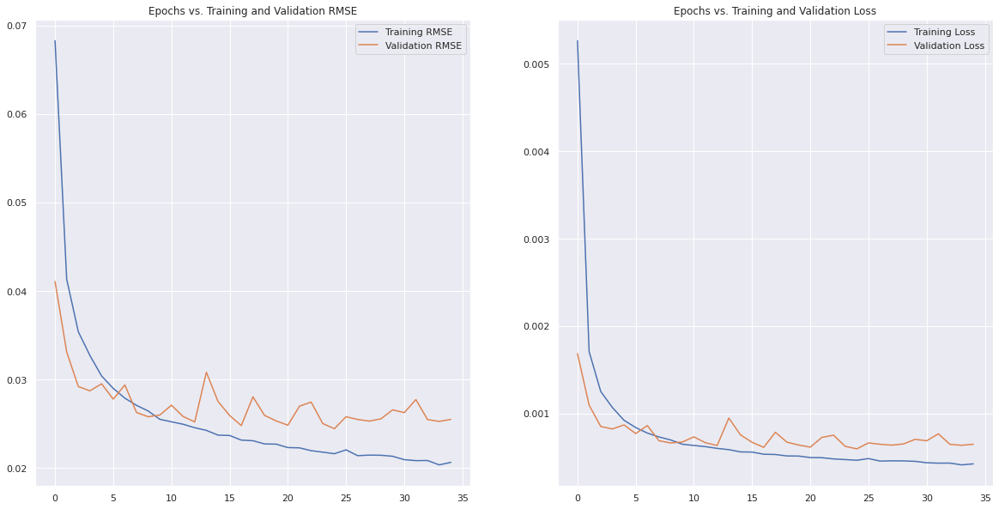

In [120]:
plot_model_rmse_and_loss(history)

In [121]:
multivariate_mlp = tf.keras.models.load_model('multivariate_mlp.h5')

forecast = multivariate_mlp.predict(X_test)
multivariate_mlp_forecast = scaler_y.inverse_transform(forecast)

rmse_mult_mlp = sqrt(mean_squared_error(y_test_inv,
                                        multivariate_mlp_forecast))
print('RMSE of hour-ahead electricity price multivariate MLP forecast: {}'
      .format(round(rmse_mult_mlp, 3)))

RMSE of hour-ahead electricity price multivariate MLP forecast: 2.329


##Encoder-Decoder

In [122]:
tf.keras.backend.clear_session()

encoder_decoder = tf.keras.models.Sequential([
    LSTM(50, activation='relu', input_shape=input_shape),
    RepeatVector(past_history),
    LSTM(50, activation='relu', return_sequences=True),
    TimeDistributed(Dense(50, activation='relu')),
    Flatten(),
    Dense(25, activation='relu'),
    Dense(1)
])



model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
                   'encoder_decoder.h5', save_best_only=True)

optimizer = tf.keras.optimizers.Adam(lr=1e-3, amsgrad=True)

encoder_decoder.compile(loss=loss,
                    optimizer=optimizer,
                    metrics=metric)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/optimizer_v2.py:356: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [123]:
history = encoder_decoder.fit(train, epochs=50,
                              validation_data=validation,
                              callbacks=[early_stopping, 
                                         model_checkpoint])

Epoch 1/50
845/845 [==============================] - 28s 30ms/step - loss: 0.0045 - root_mean_squared_error: 0.0631 - val_loss: 0.0024 - val_root_mean_squared_error: 0.0494
Epoch 2/50
845/845 [==============================] - 25s 29ms/step - loss: 0.0015 - root_mean_squared_error: 0.0381 - val_loss: 0.0016 - val_root_mean_squared_error: 0.0401
Epoch 3/50
845/845 [==============================] - 25s 30ms/step - loss: 0.0011 - root_mean_squared_error: 0.0327 - val_loss: 9.7345e-04 - val_root_mean_squared_error: 0.0312
Epoch 4/50
845/845 [==============================] - 25s 29ms/step - loss: 8.7194e-04 - root_mean_squared_error: 0.0295 - val_loss: 0.0010 - val_root_mean_squared_error: 0.0317
Epoch 5/50
845/845 [==============================] - 25s 29ms/step - loss: 7.6955e-04 - root_mean_squared_error: 0.0277 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0332
Epoch 6/50
845/845 [==============================] - 24s 29ms/step - loss: 7.0268e-04 - root_mean_squared_error: 0.02

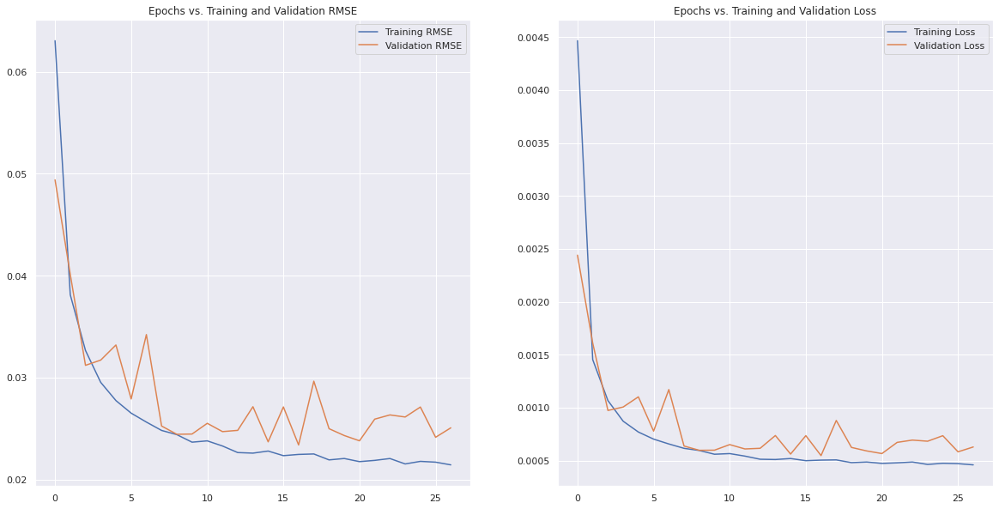

In [124]:
plot_model_rmse_and_loss(history)

In [125]:
encoder_decoder = tf.keras.models.load_model('encoder_decoder.h5')

forecast = encoder_decoder.predict(X_test)
encoder_decoder_forecast = scaler_y.inverse_transform(forecast)

rmse_encoder_decoder = sqrt(mean_squared_error(y_test_inv, 
                                               encoder_decoder_forecast))
print('RMSE of hour-ahead electricity price Encoder-Decoder forecast: {}'
      .format(round(rmse_encoder_decoder, 3)))

RMSE of hour-ahead electricity price Encoder-Decoder forecast: 2.211
